In [1]:
from io import StringIO
from copy import deepcopy
import textwrap

import incense
from incense import ExperimentLoader
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import sklearn.svm
import sklearn.metrics
import math

from src.static.settings import MONGO_URI, ENV_FILE_PATH, SPACES_DATA_BASE
from src.main.load_data.load_semanticspaces import load_mds_representation, get_names, get_classes
from scripts.create_siddata_dataset import display_mds, load_translate_mds #TODO display in scripts?!
from src.main.util.mds_object import TRANSL

from src.main.util.threedfigure import ThreeDFigure, make_meshgrid
from src.main.util.base_changer import Plane, make_base_changer

In [2]:
data_set = "courses"
cat_name = "Fachbereich"

In [3]:
# mds, _ = load_mds_representation(SPACES_DATA_BASE, data_set, mds_dim)
mds_obj = load_translate_mds("/home/chris/Documents/UNI_neu/Masterarbeit/DATA_CLONE/", f"siddata_names_descriptions_mds_3.json", translate_policy=TRANSL)
mds = mds_obj.mds
names, _ = get_names(SPACES_DATA_BASE, data_set)

<span style="font-size:10pt">Working with file siddata_names_descriptions_mds_3.json!</span>

<span style="font-size:10pt">Dropped 1669 out of 7588 descriptions because I will take english ones and ones with a translation</span>

The dissimiliarity-matrix was trained on a larger corpus than is used now!
You seem to be less than all descriptions because of the translate-policy, but as the length of the MDS corpus is longer, it seems that the corpus was trained with another translate-policy!
!! The names-list is not unique after stripping! #TODO


In [4]:
display_mds(mds, names, max_elems=2)

<span style="font-size:10pt"><span style="color: #0000ff">Roberto Arlt y la novela argentina a principios del siglo XX</span> is most similar to <span style="color: #0000ff">A2 Französisch Grundkurs II</span></span>

<span style="font-size:10pt"><span style="color: #0000ff">Didaktik I: Grundfragen der Didaktik (Tutorium 4)</span> is most similar to <span style="color: #0000ff">FFA Englisch USA - Sprache</span></span>

In [5]:
classes = get_classes(SPACES_DATA_BASE, data_set, what=cat_name)
orig_classes = deepcopy(classes)
dict(list(classes.items())[:5])

{'Roberto Arlt y la novela argentina a principios del siglo XX': 'Sprache,Literatur',
 'Didaktik I: Grundfragen der Didaktik (Tutorium 4)': 'Theologie,Lehramt,Musik',
 'Theoretische Physik 4': 'Physik',
 'Adquisición del español': 'Sprache,Literatur',
 'Grundlagen Rechtsenglisch (Kurs 2), 2. Sem. LL.B.': 'Rechtswiss'}

In [6]:
print("Embedding-Shape:", mds.embedding_.shape)
print("Number of Names:", len(names), "("+str(len(set(names)))+" unique)")
print("Elems in Classes-dict:", len(classes))

Embedding-Shape: (5919, 3)
Number of Names: 7588 (7574 unique)
Elems in Classes-dict: 7574


In [7]:
unique_classes = list(set(classes.values()))
fb_courses = {cls: [i for i in names if classes[i] == cls] for cls in unique_classes}
fb_indices = {cls: [names.index(elem) for elem in elems if names.index(elem) < mds.embedding_.shape[0]] for cls, elems in fb_courses.items()} 
{k: v[:3] for k,v in list(fb_indices.items())[:3]}

{'Mathe,Info': [29, 36, 41], 'Unknown': [5, 14, 16], 'Rechtswiss': [4, 12, 28]}

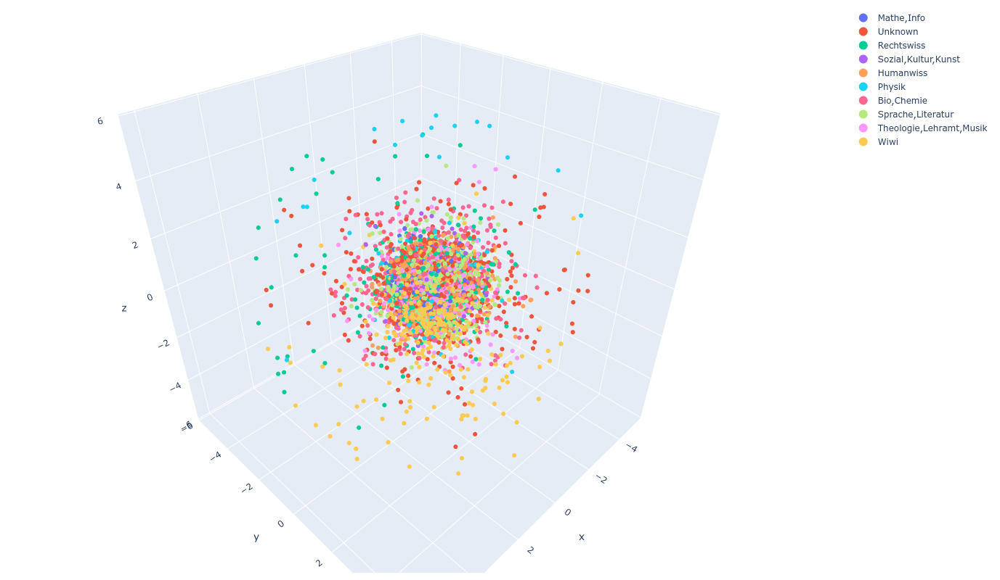

In [8]:
with ThreeDFigure() as fig:
    for ind, (clsname, indices) in enumerate(fb_indices.items()):
        fig.add_markers(mds.embedding_[indices], color=ind, size=2, name=clsname)
fig.show()

In [9]:
plot_allagainst = "Wiwi"

In [10]:
flatten = lambda l: [item for sublist in l for item in sublist] 
grouped = {plot_allagainst: fb_indices[plot_allagainst], "others": flatten([val for key, val in fb_indices.items() if key != plot_allagainst])}
{k: v[:3] for k,v in list(grouped.items())[:3]}

{'Wiwi': [9, 17, 61], 'others': [29, 36, 41]}

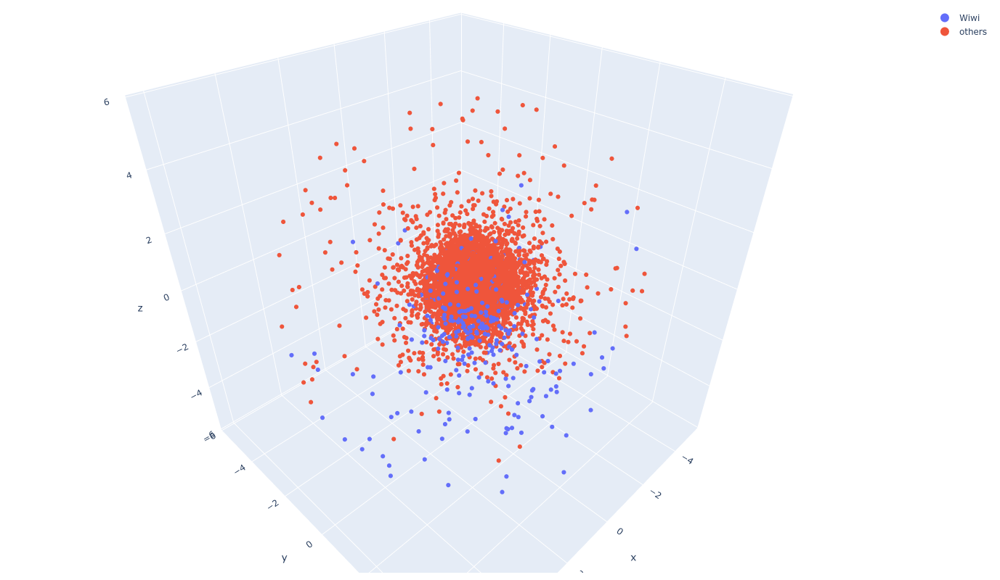

In [11]:
with ThreeDFigure() as fig:
    for ind, (clsname, indices) in enumerate(grouped.items()):
        custom_data = [{"Name": names[i], "FB": orig_classes[names[i]], "extra": {"Description": mds_obj.descriptions[i]}} for i in indices]
        fig.add_markers(mds.embedding_[indices], color=ind, size=2, name=clsname, custom_data=custom_data)
fig.show()

In [12]:
classes = np.array([i in grouped["others"] for i in range(mds.embedding_.shape[0])], dtype=int)

svm = sklearn.svm.LinearSVC(dual=False, class_weight="balanced")
svm.fit(mds.embedding_, classes)
svm_results = svm.decision_function(mds.embedding_)

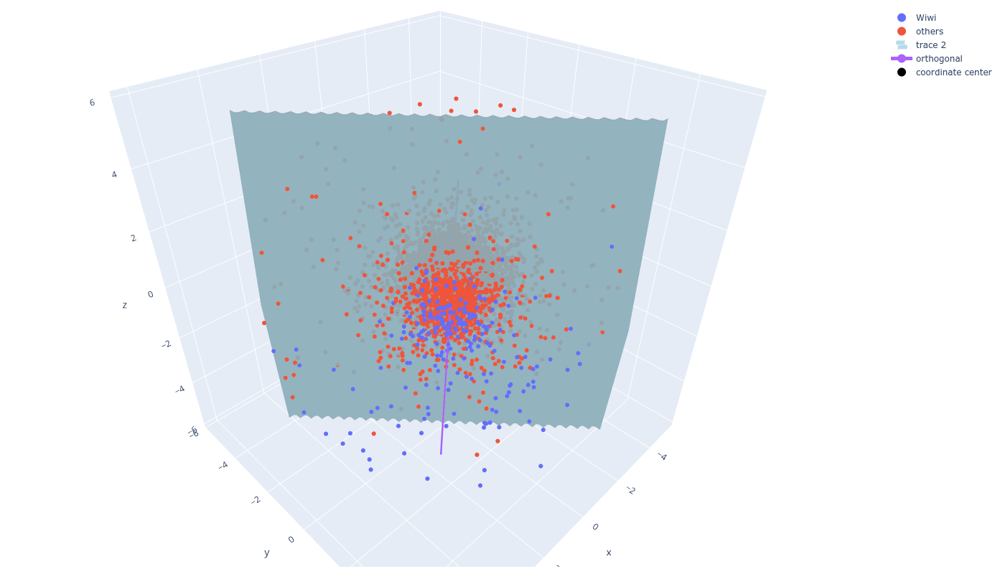

In [13]:
decision_plane = Plane(*svm.coef_[0], svm.intercept_[0])
forward, backward = make_base_changer(decision_plane)

prototypicality_pre = lambda x: abs(forward(x)[0])
all_prototyp = [prototypicality_pre(mds.embedding_[i]) for i in range(len(mds.embedding_))]
prototypicality = lambda x: round(((prototypicality_pre(x)-min(all_prototyp))/(max(all_prototyp)-min(all_prototyp)))*100, 2)

with ThreeDFigure() as fig:   #forward, backward, swap_axes="xz"
    #fig.add_markers(mds.embedding_, color=classes, size=1)  # samples
    for ind, (clsname, indices) in enumerate(grouped.items()):
        custom_data = [{"Name": names[i], "FB": orig_classes[names[i]], "prototypicality": prototypicality(mds.embedding_[i]), "prototypicality_pre": prototypicality_pre(mds.embedding_[i]), "extra": {"Description": mds_obj.descriptions[i]}} for i in indices]
        fig.add_markers(mds.embedding_[indices], color=ind, size=2, name=clsname, custom_data=custom_data)
    fig.add_surface(decision_plane, mds.embedding_, classes, margin=0.1, color="lightblue", showlegend=True)   # decision hyperplane
    
    fig.add_line(mds.embedding_.mean(axis=0) - decision_plane.normal*20, mds.embedding_.mean(axis=0) + decision_plane.normal*20, width=5, name="orthogonal") 
    fig.add_markers([0, 0, 0], size=3, name="coordinate center") 
    #fig.add_line(-decision_plane.normal * 5, decision_plane.normal * 5)  # orthogonal of decision hyperplane through [0,0,0]
    #fig.add_sample_projections(X, decision_plane.normal)  # orthogonal lines from the samples onto the decision hyperplane orthogonal

fig.show()

In [33]:
#To check distance measures etc, run first this:
# decision_plane = Plane(*svm.coef_[0], svm.intercept_[0])
# forward, backward = make_base_changer(decision_plane)
# X = [mds.embedding_[i] for ind, (clsname, indices) in enumerate(grouped.items()) for i in indices]

In [34]:
correct_preds = [classes[i] == (svm_results[i] > 0) for i in range(len(classes))]
correct_percentage = round(sum(correct_preds)/len(correct_preds), 4)*100
correct_percentage

83.61

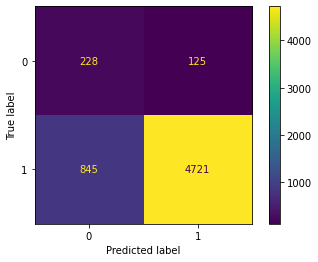

In [35]:
conf_mat = sklearn.metrics.confusion_matrix(y_true=classes, y_pred=[svm_results[i] > 0 for i in range(len(classes))])
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(svm, mds.embedding_, classes)

In [36]:
print(round(conf_mat[0,0]/conf_mat[0].sum()*100, 2))
print(round(conf_mat[1,1]/conf_mat[1].sum()*100, 2))
#forget (->remove) this cell, see cell below. I'm too scared to replace these cells bc I'm afraid I need to change a lot of code if I re-run above cells.

64.59
84.82


In [ ]:
tn, fp, fn, tp = conf_mat.ravel()
precision = tp / (tp + fp)
recall = tp / (tp + fn)
accuracy = (tp + tn) / len(labels)
print(f"accuracy: {accuracy:.2f} | precision: {precision:.2f} | recall: {recall:.2f}")